In [51]:
import scipy as sci
from scipy.io import loadmat
import numpy as np
import cv2
import imageio
import matplotlib.pyplot as plt
import sys
import pathlib
sys.path.append('src')

In [41]:
import importlib
import models
importlib.reload(models)

<module 'models' from '/home/PJLAB/weigengchen/CodeSpace/projects/ASM/ASM/src/models.py'>

# prepare data

In [29]:
from data_loader import load_data
landmarks, face_files = load_data()
landmarks.shape, len(face_files), face_files[:5]

((152, 228),
 228,
 ['DATA/valid_faces/i000qa-fn.jpg',
  'DATA/valid_faces/i000ra-fn.jpg',
  'DATA/valid_faces/i000sa-fn.jpg',
  'DATA/valid_faces/i001qa-mn.jpg',
  'DATA/valid_faces/i001ra-mn.jpg'])

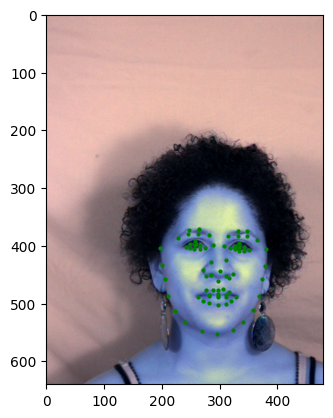

In [30]:
im1 = cv2.imread(face_files[200])
plt.imshow(im1)
im1_landmark = landmarks[:,200].reshape(-1, 2)
plt.scatter(im1_landmark[:,0], im1_landmark[:,1], color='g', s=4)
plt.show()

# Shape model


In [31]:
from models import Shape_Model
from utils import generalized_proc

shape_model = Shape_Model(landmarks)

## Alignment
### Procrustes analysis

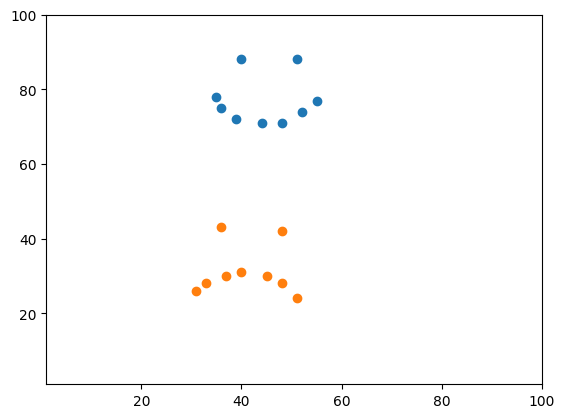

In [32]:
X = np.array([40, 88, 51, 88, 35, 78, 36, 75, 39, 72, 44, 71, 48, 71, 52, 74, 55, 77]);
Y = np.array([36, 43, 48, 42, 31, 26, 33, 28, 37, 30, 40, 31, 45, 30, 48, 28, 51, 24]);
X = X.reshape(-1, 2)
Y = Y.reshape(-1, 2)
plt.scatter(X[:,0], X[:,1])
plt.scatter(Y[:,0], Y[:,1])
plt.xlim((1, 100))
plt.ylim((1, 100))
plt.show()

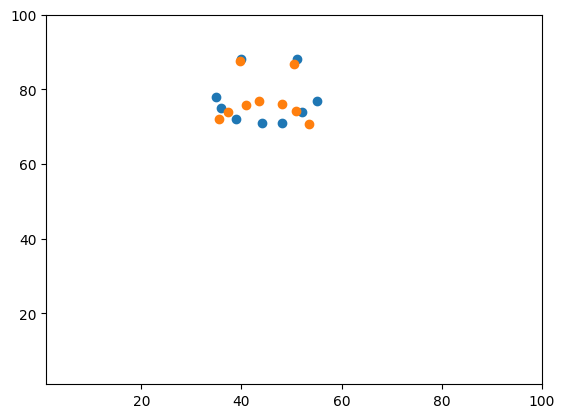

In [33]:
rotate, translate, Y2 = generalized_proc(X, Y)
# Y2 = Y @ rotate.T + translate

plt.scatter(X[:,0], X[:,1])
plt.scatter(Y2[:,0], Y2[:,1])
plt.xlim((1, 100))
plt.ylim((1, 100))
plt.show()

### Align the training data

Text(0.5, 1.0, 'align twice')

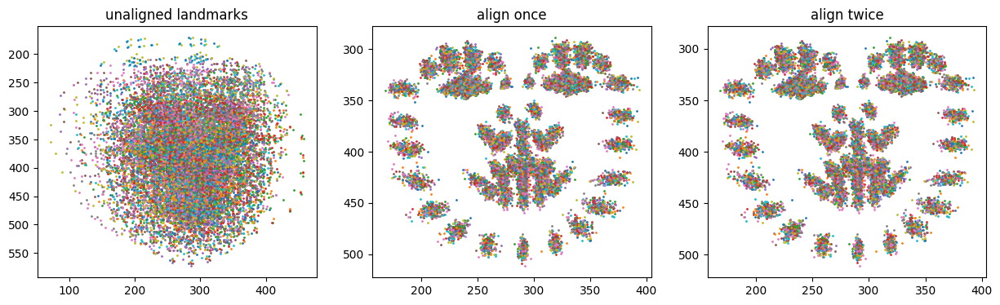

In [34]:
def show_landmarks(landmarks):
    for i in range(landmarks.shape[-1]):
        landmark = landmarks[:, i].reshape(-1, 2)
        plt.scatter(landmark[:,0], landmark[:,1], s=1)

plt.figure(figsize=(15, 4))
plt.subplot(1,3,1)
plt.gca().invert_yaxis()
show_landmarks(shape_model.unaligned_shapes)
plt.title("unaligned landmarks")
plt.subplot(1,3,2)
plt.gca().invert_yaxis()
show_landmarks(shape_model.aligned_shapes)
plt.title("align once")
plt.subplot(1,3,3)
plt.gca().invert_yaxis()
aligned_shapes2 = shape_model.align(shape_model.aligned_shapes)
show_landmarks(aligned_shapes2)
plt.title("align twice")

## PCA

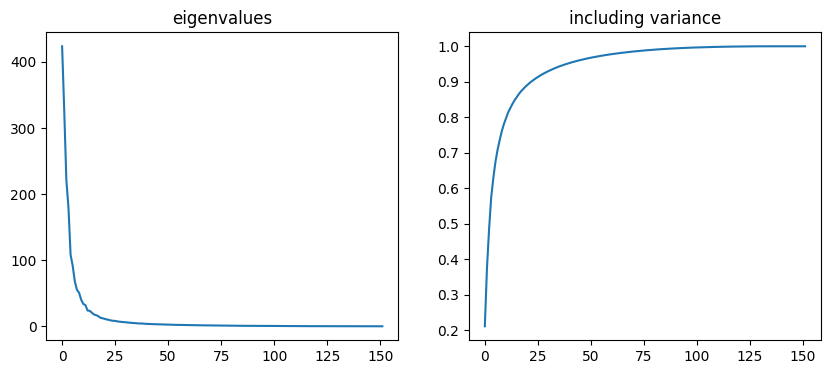

In [35]:
plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
plt.plot(shape_model.eig_val)
plt.title("eigenvalues")
plt.subplot(1,2,2)
plt.plot(np.cumsum(shape_model.eig_val)/np.sum(shape_model.eig_val))
plt.title("including variance")
plt.show()

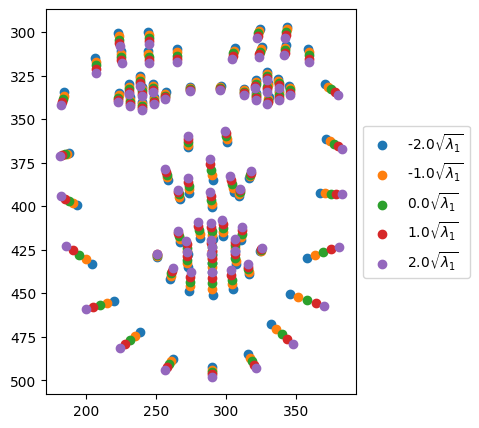

In [36]:
plt.figure(figsize=(5, 5))
ax = plt.subplot(1,1,1)
# plt.scatter(shape_model.x_mean[::2], shape_model.x_mean[1::2])
# plt.rcParams['text.usetex'] = False
x_mean = shape_model.x_mean
p1 = shape_model.eig_vec[:,0]
lambda1 = shape_model.eig_val[0]
for i, coeff in enumerate(np.linspace(-2, 2, 5)):

    # plt.subplot(1, 5, i+1)
    shape_shifted = x_mean + p1 * coeff * np.sqrt(lambda1)
    plt.scatter(shape_shifted[::2], shape_shifted[1::2], label="{}".format(coeff)+r"$\sqrt{\lambda_1}$")
    plt.gca().invert_yaxis()
    # plt.title("shift b1 = {}".format(coeff))

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

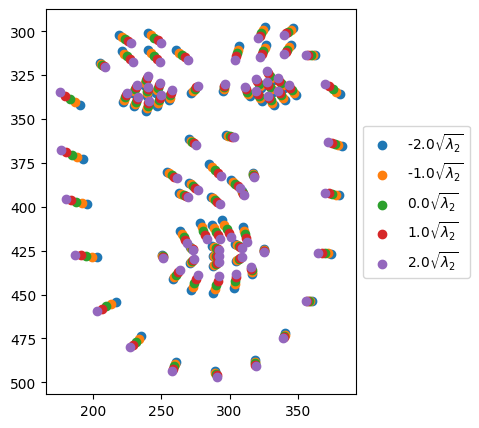

In [37]:
plt.figure(figsize=(5, 5))
ax = plt.subplot(1,1,1)
# plt.scatter(shape_model.x_mean[::2], shape_model.x_mean[1::2])
# plt.rcParams['text.usetex'] = False
x_mean = shape_model.x_mean
p1 = shape_model.eig_vec[:,1]
lambda1 = shape_model.eig_val[1]
for i, coeff in enumerate(np.linspace(-2, 2, 5)):

    # plt.subplot(1, 5, i+1)
    shape_shifted = x_mean + p1 * coeff * np.sqrt(lambda1)
    plt.scatter(shape_shifted[::2], shape_shifted[1::2], label="{}".format(coeff)+r"$\sqrt{\lambda_2}$")
    plt.gca().invert_yaxis()
    # plt.title("shift b1 = {}".format(coeff))

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Gray model

In [38]:
from models import One_level_gray_model
gray_model = One_level_gray_model(face_files, {"window_size": 5}, np.rint(landmarks.reshape(-1, 2, landmarks.shape[1])).astype(np.int32))

## Smoothing kernel

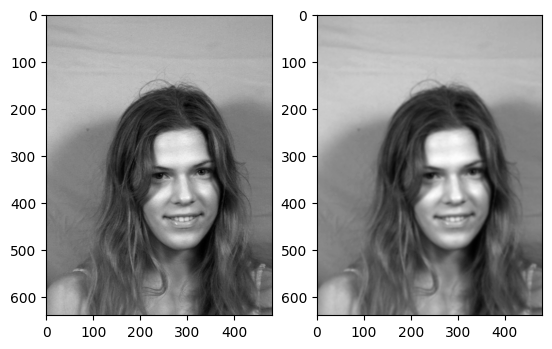

In [47]:
plt.subplot(1,2,1)
im11 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
plt.imshow(im11, cmap='gray')
plt.subplot(1,2,2)
smooth_image = cv2.GaussianBlur(im11,(7, 7), 0)
plt.imshow(smooth_image, cmap='gray')
plt.show()

## Edge strength

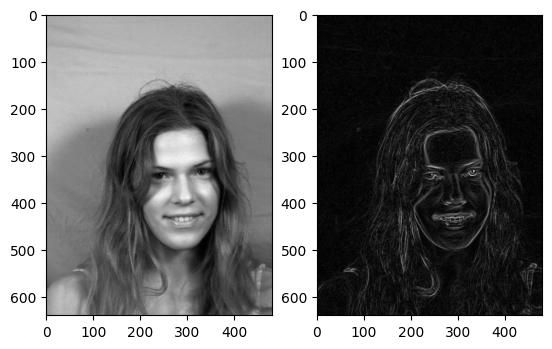

In [48]:
plt.subplot(1,2,1)
im11 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
plt.imshow(im11, cmap='gray')
plt.subplot(1,2,2)
im_edge = gray_model.edge_feature(im11)
plt.imshow(im_edge, cmap='gray')
plt.show()

# Find the Face

In [42]:
from models import Face_Detect
face_detect = Face_Detect(shape_model, gray_model, search_size=10)

1


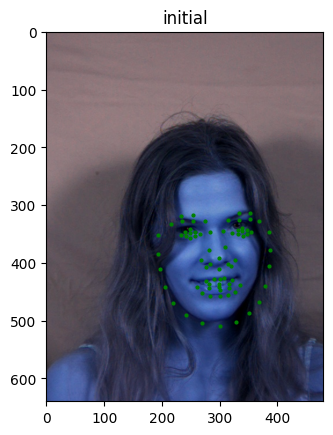

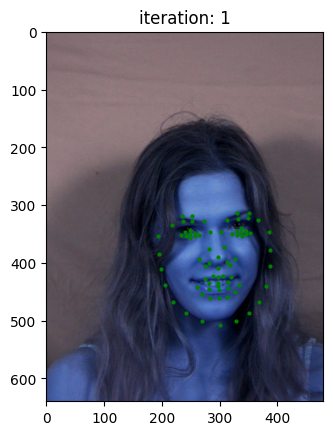

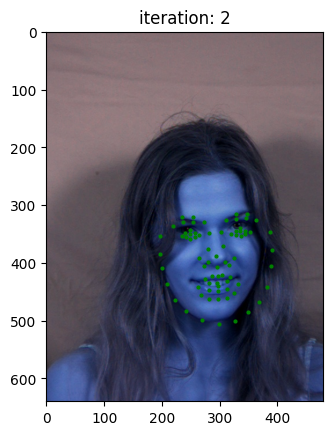

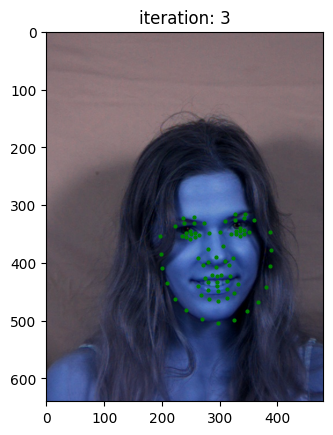

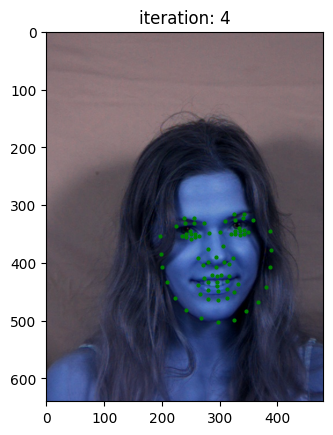

...

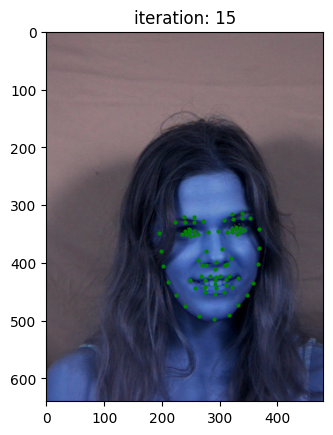

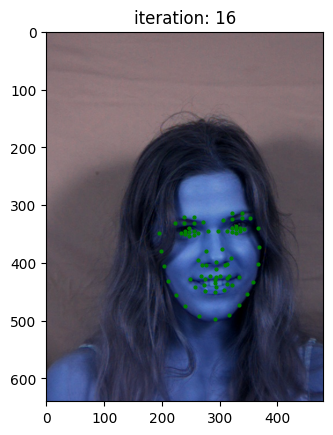

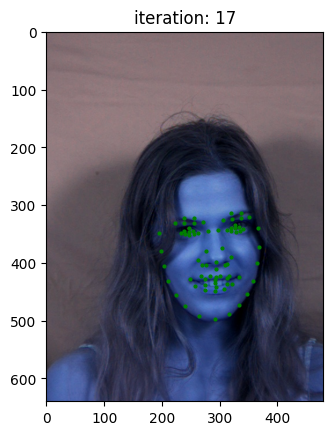

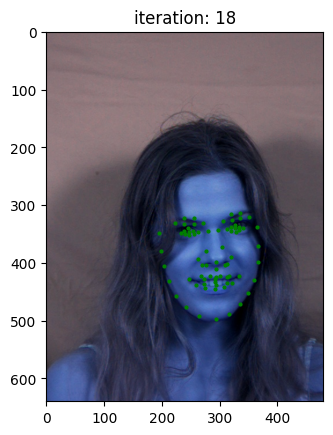

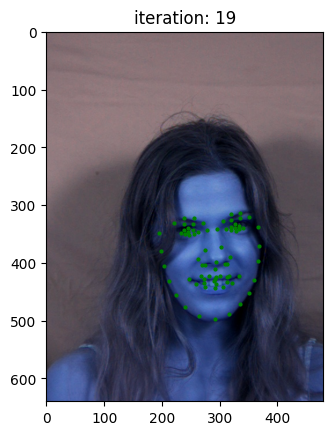

In [43]:
features = []
def callback(feature, i):
    if i % 1 == 0:
        kkk2 = feature.reshape(-1, 2)
        features.append((kkk2, i))
        plt.imshow(im1, cmap='gray')
        plt.scatter(kkk2[:,0], kkk2[:,1], s=4, color='g')
        if i == 0:
            plt.title("initial")
        else:
            plt.title("iteration: {}".format(i))
        plt.show()
    return
im1 = cv2.imread(face_files[0])
kkk = face_detect(im1, max_iter=20, n_pcs=8, callback=callback)

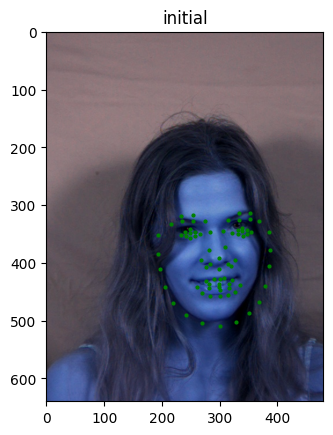

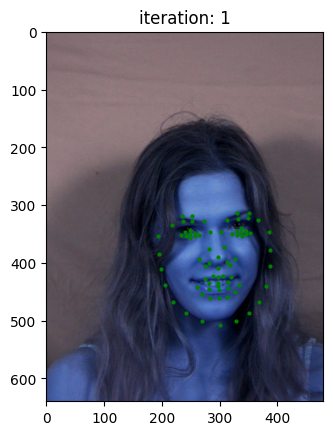

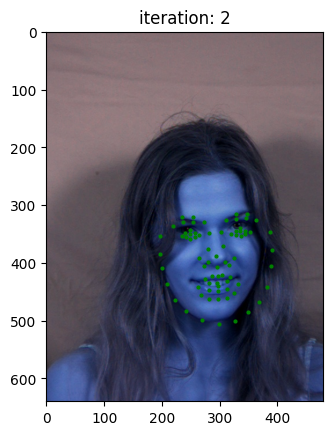

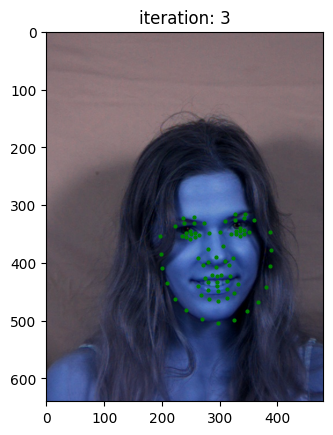

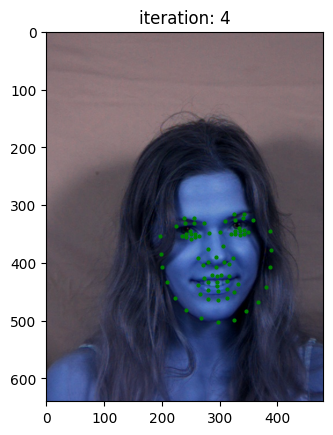

...

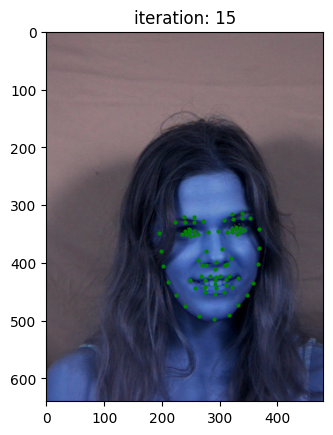

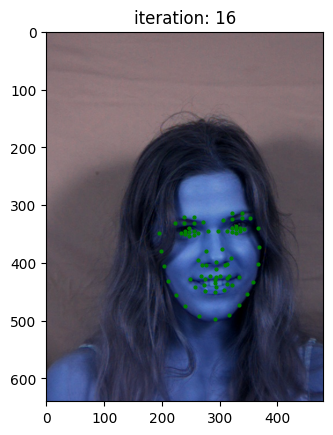

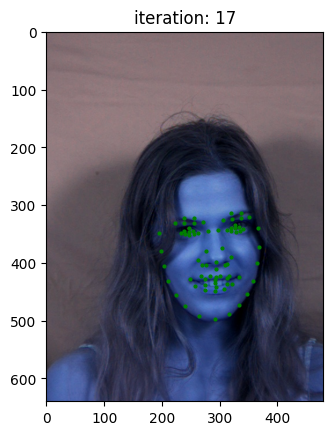

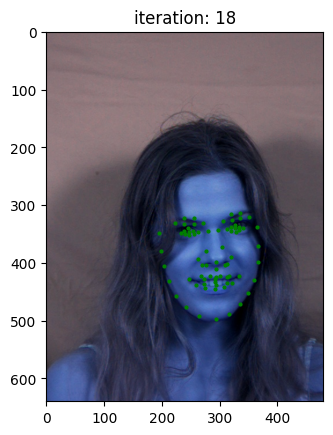

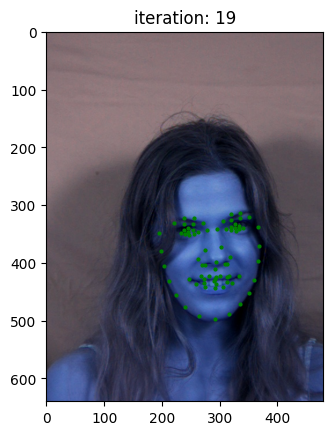

In [52]:
save_dir = "results/try2"
pathlib.Path(save_dir).mkdir(parents=True, exist_ok=True)
for feature, i in features:
    fig = plt.figure()
    plt.imshow(im1, cmap='gray')
    plt.scatter(feature[:,0], feature[:,1], s=4, color='g')
    if i == 0:
        plt.title("initial")
    else:
        plt.title("iteration: {}".format(i))
    plt.savefig("{}/{}.jpg".format(save_dir, i))

In [53]:
import imageio
with imageio.get_writer(f'{save_dir}/animation.gif', mode='I', duration=1) as writer:
    for i in range(len(features)):
        image = imageio.imread("{}/{}.jpg".format(save_dir, i))
        writer.append_data(image)

/tmp/ipykernel_2627004/2565142144.py:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread("{}/{}.jpg".format(save_dir, i))
